In [2]:
import pandas as pd
import numpy as np
import string as s
import seaborn as sns
import math
# import tables
import matplotlib
import matplotlib.pyplot as plt
from itertools import groupby
import scipy.stats as stats
from scipy.ndimage.interpolation import shift
# matplotlib.style.use('ggplot')
# %matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12, 6)
# matplotlib.rcParams['figure.facecolor'] = 'white'


In [56]:
f1 = '/projects/trans_scratch/validations/workspace/szong/Cervical/variant_bwamem/124_patients/124_patients_bam_vcf.txt'
df1 = pd.read_csv(f1, sep='\t', index_col='patient',usecols=['patient', 'strelka_snv_vcf', 'strelka_indel_vcf'])
# remove normals
df1 = df1[~df1.strelka_snv_vcf.isnull()]
df1.head(2)

,strelka_snv_vcf,strelka_indel_vcf
patient,,
HTMCP-03-06-02001,/projects/somatic/NCI_SAIC_HIV_Cervical/HTMCP-...,/projects/somatic/NCI_SAIC_HIV_Cervical/HTMCP-...
HTMCP-03-06-02002,/projects/somatic/NCI_SAIC_HIV_Cervical/HTMCP-...,/projects/somatic/NCI_SAIC_HIV_Cervical/HTMCP-...


In [57]:
df1.shape

(124, 2)

In [58]:
# x_patients = ['HTMCP-03-06-02007', 'HTMCP-03-06-02026', 'HTMCP-03-06-02061'] # 2 hyper-mutated cases, 1 previous maligancy
x_patients = ['HTMCP-03-06-02061']

In [59]:
df1 = df1[~df1.index.isin(x_patients)]

In [60]:
df1.shape

(123, 2)

In [28]:
# strelka annotations:
# DOWNSTREAM
# EXON
# INTERGENIC
# INTRAGENIC
# INTRON
# NON_SYNONYMOUS_CODING
# START_GAINED
# START_LOST
# STOP_GAINED
# STOP_LOST
# SYNONYMOUS_CODING
# UPSTREAM
# UTR_3_PRIME
# UTR_5_PRIME

In [71]:
coding_annts = ['EXON', 'NON_SYNONYMOUS_CODING', 
                'START_GAINED', 'START_LOST', 
                'STOP_GAINED', 'STOP_LOST', 
                'SYNONYMOUS_CODING']

In [61]:
cdf = pd.DataFrame()
for index, row in df1.iterrows():
    indel = row.strelka_indel_vcf
    snv = row.strelka_snv_vcf
#     print(snv)
    df_snv = pd.read_csv(snv, sep='\t', comment='#', header=None)[[0,1,3,4,7]]
    df_indel = pd.read_csv(indel, sep='\t', comment='#', header=None)[[0,1,3,4,7]]
    tdf = pd.concat([df_snv, df_indel], axis=0)
    tdf[8] = tdf[7].apply(lambda x: x.split('EFF=')[1].split('(')[0])
    tdf = tdf.drop(7, axis=1)
#     look at all region first then focus on non-coding region
#     tdf = tdf.loc[~tdf[8].isin(coding_annts)]
    tdf.index = [index]*(tdf.shape[0])
    tdf.columns = ['chr', 'pos', 'ref', 'alt', 'eff']

    if cdf.empty:
         cdf = tdf
    else:
        cdf = pd.concat([cdf, tdf], axis=0)
cdf.head()

/projects/da_workspace/software/miniconda/envs/dlpy3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,chr,pos,ref,alt,eff
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM
HTMCP-03-06-02001,1,737454,G,C,DOWNSTREAM
HTMCP-03-06-02001,1,757477,T,C,DOWNSTREAM
HTMCP-03-06-02001,1,758253,G,A,DOWNSTREAM


In [10]:
of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/all_strelka_calls_121_patients_2061_2007_2026_removed.txt'
# cdf.to_csv(of, sep='\t')

In [11]:
cdf = pd.read_csv(of, sep='\t', index_col=0)
cdf.head(2)
# cdf.to_csv(of, sep='\t')

,chr,pos,ref,alt,eff
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM


In [62]:
cdf.shape

(7089883, 5)

In [63]:
cdf.chr.unique()

array(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', 'X',
       'MT', 'GL000229.1', 'GL000231.1', 'GL000235.1', 'GL000247.1',
       'GL000234.1', 'GL000232.1', 'GL000240.1', 'GL000241.1',
       'GL000243.1', 'GL000230.1', 'GL000237.1', 'GL000233.1',
       'GL000198.1', 'GL000208.1', 'GL000191.1', 'GL000228.1',
       'GL000214.1', 'GL000221.1', 'GL000218.1', 'GL000220.1',
       'GL000213.1', 'GL000211.1', 'GL000199.1', 'GL000217.1',
       'GL000216.1', 'GL000205.1', 'GL000219.1', 'GL000224.1',
       'GL000195.1', 'GL000193.1', 'GL000194.1', 'GL000225.1',
       'GL000192.1', 'GL000226.1', 'GL000212.1', 'GL000222.1',
       'GL000246.1', 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 'GL000207.1', 'GL000239.1', 'GL000203.1',
       'GL000248.1', 'GL000244.1', 'GL000238.1', 'GL000202.1',
       'GL000204.1', 'GL000209.1', 'GL000245.1'], dtype=object)

In [64]:
cdf['chr'] = cdf['chr'].astype(str)

In [65]:
cdf.shape

(7089883, 5)

In [66]:
chromosomes = [str(i) for i in np.arange(1,23)] + ['X']

In [67]:
ddf = cdf[cdf.chr.isin(chromosomes)]


In [68]:
ddf.shape

(7038889, 5)

In [69]:
ddf.head()

,chr,pos,ref,alt,eff
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM
HTMCP-03-06-02001,1,737454,G,C,DOWNSTREAM
HTMCP-03-06-02001,1,757477,T,C,DOWNSTREAM
HTMCP-03-06-02001,1,758253,G,A,DOWNSTREAM


In [70]:
ddf.chr.unique() 

array(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', 'X'],
      dtype=object)

In [337]:
ddf.to_csv('/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/non_coding_mutations_121_patients_24_chromosomes_only.txt', sep='\t')

In [23]:
ddf.head(2)

,chr,pos,ref,alt,eff
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM


In [24]:
nmutations = ddf.groupby('chr').count()['pos'].to_frame()

In [25]:
nmutations.head(2)

,pos
chr,
1,229174
10,122530


In [26]:
f2 = '/home/szong/projects/resource/chrominfo.txt'
df2 = pd.read_csv(f2, sep='\t', usecols=['#chrom', 'size'])
df2.head(2)

,#chrom,size
0,chr1,249250621
1,chr2,243199373


In [27]:
df2['chr'] = df2['#chrom'].apply(lambda x: x.replace('chr', ''))
df2 = df2.set_index('chr').drop('#chrom', axis=1)
df2.head(2)

,size
chr,
1,249250621
2,243199373


In [378]:
# df2

In [28]:
mdf = pd.merge(nmutations, df2, left_index=True, right_index=True)

In [29]:
mdf['mut_rate'] = mdf.pos/mdf['size']*1000000
mdf = mdf.sort_values('mut_rate', ascending=False)

In [30]:
mdf.head(2)
mdf.rename(columns={'pos':'num_mutations'}, inplace=True)

In [48]:
of2 = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/121_pats_mut_rate.txt'
mdf.to_csv(of2)

In [76]:
mdf.head()

,num_mutations,size,mut_rate
chr,,,
X,191260,155270560,1231.785343
19,63953,59128983,1081.584644
3,205997,198022430,1040.271044
20,65060,63025520,1032.280257
18,79991,78077248,1024.511007


In [77]:
of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/mut_rate.txt'
mdf.to_csv(of, sep='\t')

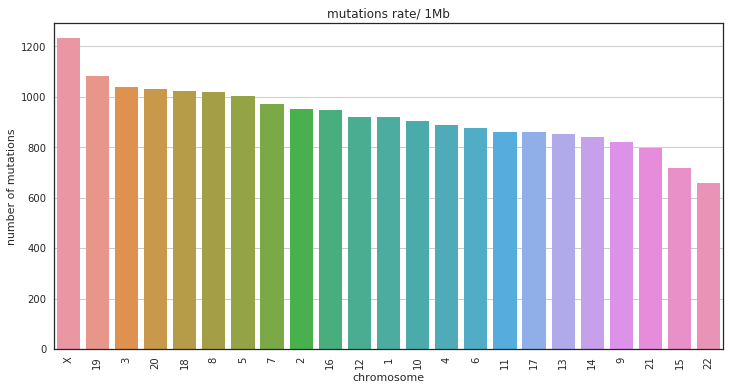

In [51]:
# look at general mutation rate

with plt.style.context("seaborn-whitegrid"):
    plt.rcParams["axes.edgecolor"] = "0.15"
    plt.rcParams["axes.linewidth"]  = 1.25
    fig = plt.figure(facecolor='w')
    p = sns.barplot(mdf.index, 'mut_rate', data = mdf)#, ci=None)
    _ = plt.setp(p.get_xticklabels(), rotation=90)
    _ = plt.title('mutations rate/ 1Mb')
    _ = plt.xlabel('chromosome')
    _ = plt.ylabel('number of mutations')
    pass
#     mdf['mut_rate'].plot(kind='bar', title='mutations/1Mb')
    of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/average_pooled_mutation_rate_chromosome_less_3_patients.png'
    plt.savefig(of, dpi=200)
    plt.show()
    plt.close()

In [32]:
cdf.head()

,chr,pos,ref,alt,eff
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM
HTMCP-03-06-02001,1,737454,G,C,DOWNSTREAM
HTMCP-03-06-02001,1,757477,T,C,DOWNSTREAM
HTMCP-03-06-02001,1,758253,G,A,DOWNSTREAM


In [22]:
# of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/121_pats_all_strelka_mutations.txt'
# # cdf = pd.read_csv(of, index_col=0)
# # cdf.head()
# cdf.to_csv(of)

# remove coding mutations

In [75]:
of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/123_pats_all_strelka_noncoding_mutations.txt'
# ddf = cdf[~cdf.eff.str.contains("HIGH|MODERATE|LOW")]
ddf.to_csv(of)

In [66]:
cdf.shape

(2879384, 5)

In [34]:
ddf.shape

(2839310, 5)

In [74]:
ddf.head(2)

,chr,pos,ref,alt,eff
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM


In [72]:
ddf = ddf.loc[~ddf['eff'].isin(coding_annts)]

In [73]:
ddf.shape

(6952476, 5)

# sliding window analysis

In [38]:
# these are somatic non-coding mutation only, including all modifier events,eg. intergenic, intronic, utr, intragenic, downstream etc.
f1 = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/121_pats_all_strelka_mutations_hml_removed.txt'
df1 = pd.read_csv(f1)
df1.head()

,Unnamed: 0,chr,pos,ref,alt,eff
0,HTMCP-03-06-02001,1,59734,A,G,NT=ref;QSS=33;QSS_NT=33;SGT=AA->AG;SOMATIC;TQS...
1,HTMCP-03-06-02001,1,694016,G,A,NT=ref;QSS=26;QSS_NT=26;SGT=GG->AG;SOMATIC;TQS...
2,HTMCP-03-06-02001,1,737454,G,C,NT=ref;QSS=28;QSS_NT=28;SGT=GG->CG;SOMATIC;TQS...
3,HTMCP-03-06-02001,1,757477,T,C,NT=ref;QSS=18;QSS_NT=18;SGT=TT->CT;SOMATIC;TQS...
4,HTMCP-03-06-02001,1,758253,G,A,NT=ref;QSS=16;QSS_NT=16;SGT=GG->AG;SOMATIC;TQS...


In [296]:
df1.set_index('Unnamed: 0', inplace=True)
del df1.index.name
df1.head()

,chr,pos,ref,alt,eff
HTMCP-03-06-02001,1,59734,A,G,NT=ref;QSS=33;QSS_NT=33;SGT=AA->AG;SOMATIC;TQS...
HTMCP-03-06-02001,1,694016,G,A,NT=ref;QSS=26;QSS_NT=26;SGT=GG->AG;SOMATIC;TQS...
HTMCP-03-06-02001,1,737454,G,C,NT=ref;QSS=28;QSS_NT=28;SGT=GG->CG;SOMATIC;TQS...
HTMCP-03-06-02001,1,757477,T,C,NT=ref;QSS=18;QSS_NT=18;SGT=TT->CT;SOMATIC;TQS...
HTMCP-03-06-02001,1,758253,G,A,NT=ref;QSS=16;QSS_NT=16;SGT=GG->AG;SOMATIC;TQS...


In [297]:
df1['eff'] = df1['eff'].apply(lambda x: x.split('EFF=')[1].split('(')[0])
df1.head()

,chr,pos,ref,alt,eff
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM
HTMCP-03-06-02001,1,737454,G,C,DOWNSTREAM
HTMCP-03-06-02001,1,757477,T,C,DOWNSTREAM
HTMCP-03-06-02001,1,758253,G,A,DOWNSTREAM


In [298]:
cdf = df1.copy()

In [299]:
cdf.head()

,chr,pos,ref,alt,eff
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM
HTMCP-03-06-02001,1,737454,G,C,DOWNSTREAM
HTMCP-03-06-02001,1,757477,T,C,DOWNSTREAM
HTMCP-03-06-02001,1,758253,G,A,DOWNSTREAM


In [300]:
cdf.shape

(2844387, 5)

In [301]:
# s = pd.Series(cdf.index.tolist()).value_counts()
# df11 = pd.DataFrame({'pat':s.index, 'nmutations': s.values})
# df11.head()
# # plt.plot(df11['nmutations'].plot(kind='bar'),kind='bar')
# df11['nmutations'].plot(kind='bar')
# plt.show()

In [40]:
of2 = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/121_pats_mut_rate.txt'
mdf = pd.read_csv(of2, index_col='chr')

In [41]:
mdf.head(2)

,num_mutations,size,mut_rate
chr,,,
X,191260,155270560,1231.785343
19,63953,59128983,1081.584644


In [42]:
def merge_intervals(intervals):
    merged = []
    sorted_by_lower_bound = sorted(intervals, key=lambda lst: lst[0])
    for higher in sorted_by_lower_bound:
        if not merged:
            merged.append(higher)
        else:
            lower = merged[-1]
            # test for intersection between lower and higher:
            # we know via sorting that lower[0] <= higher[0]
            if higher[0] <= lower[1]+1:            
                upper_bound = max(lower[1], higher[1])
                merged[-1] = [lower[0], upper_bound]  # replace by merged interval
            else:
                merged.append(higher)
    return merged

In [43]:
def windowsum(arr, wsize, stride, avg_mrate, chrm, mfold):
    if chrm == 'X':
        chrm = '23'
    if chrm == 'Y':
        chrm = '24'
    arr_len = arr.shape[0]
    wnum = math.ceil((arr_len - wsize + 1)/stride)
    idxs = np.arange(wsize)[None,:] + stride*np.arange(wnum)[:, None]
    # ignored last window with insufficient element
    if idxs.max() > arr_len:
        idxs = idxs[:-1]
    b = arr[idxs]
    nmuts = np.sum(b, axis=1)
    rate = 1000000*nmuts/wsize
#     pick windows with mutation rate more than 2xaverage mut rate
    spots = idxs[np.where(rate > mfold*avg_mrate)[0]][:,[0,-1]]
    nws = len(spots)


    if nws > 0:            
        merged_spots = merge_intervals(spots)
        merged_spots = np.hstack (([[chrm]] * len(merged_spots), merged_spots))
#     print(merged_spots)
    return [nmuts, merged_spots]

In [44]:
a = np.array([1,0,2,3,1,2,0,0,1,2])
assert all(windowsum(a, 5, 2, 0.35*1000000, 1, 2)[0] == np.array([7,8,4]))

# f11 = 'a.test'
# np.savetxt(f11, windowsum(a, 5, 2, 0.35*1000000, 1)[1], delimiter="\t", fmt='%10.0f')

In [45]:
mfold = 10
wsize = 1000
stride = 200

In [308]:
# NUM_COLS = 3
# NUM_ROWS = 10000000
# fn = 'windowsize_{0}_stride_{1}_threshold_{2}x_mutation_rate.2007_2026_2061_removed'.format(wsize, stride, mfold)
# fh = tables.open_file(fn, mode='w')
# atom = tables.Int64Atom()
# array_c = fh.create_earray(fh.root, 'data', atom, (0, NUM_COLS))
# fh.close()

In [309]:
# qdf.pos.value_counts().sort_index()


In [46]:
# locate window number for centromere
f2 = '/home/szong/projects/resource/centromere.pos.txt'
df2 = pd.read_csv(f2, sep='\t')
df2.head()

,chr,start,end,arm,annot
0,1,121100000,124300000,p11.1,acen
1,1,124300000,128000000,q11,acen
2,10,38800000,40300000,p11.1,acen
3,10,40300000,42100000,q11.1,acen
4,11,51400000,52900000,p11.11,acen


In [47]:
def determine_centwin(df, chrm, wsize, stride, chrm_len):
    if chrm == 'X':
        chrm = '23'
    if chrm == 'Y':
        chrm = '24'
    dftmp = (df.query('chr == "{}"'.format(chrm))[['start', 'end']])
    cen_start = dftmp.min().min()
    cen_end = dftmp.max().max()
    wnum = math.ceil((chrm_len - wsize + 1)/stride)
    idxs = np.arange(wsize)[None,:] + stride*np.arange(wnum)[:, None]
#     if cen_start in idxs
#     print(wnum, idxs)
    for i, win in enumerate(idxs):
        if cen_start in win:
            winstart = i
        if cen_end in win:
            winend = i
#     print(winstart, winend)
    return [winstart, winend]


In [48]:
assert(determine_centwin(df2, 99, 3, 2, 30) == [6,9])

processing chromosome: 21
CPU times: user 3.37 s, sys: 1.14 s, total: 4.51 s
Wall time: 2.74 s
processing chromosome: 22
CPU times: user 3.3 s, sys: 1.2 s, total: 4.5 s
Wall time: 2.91 s


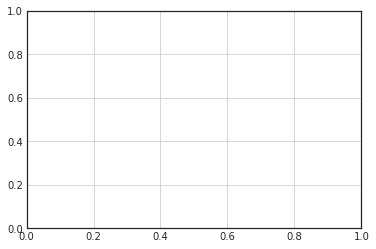

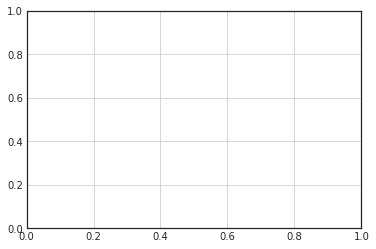

In [49]:
df_regions = pd.DataFrame()
for chrm in ['21', '22']:#chromosomes: #
    print('processing chromosome:', chrm)
    with plt.style.context("seaborn-whitegrid"):
        plt.rcParams["axes.edgecolor"] = "0.15"
        plt.rcParams["axes.linewidth"]  = 1.25
        fig = plt.figure(facecolor='w')
        ax = fig.add_subplot(111)
        chrm_len = mdf.loc[chrm, 'size']
#         centromere location
        centstart, centend = determine_centwin(df2, chrm, wsize, stride, chrm_len) 
        
        qdf = cdf.query('chr == "{}"'.format(chrm))

        zero_arr = np.zeros(chrm_len)
        avg_mrate = mdf.loc[chrm, 'mut_rate']
        w_mrate = wsize * avg_mrate/1000000
#         count numbe of mutation at each position and sort position
        vc_arr = qdf.pos.value_counts().sort_index()
        zero_arr[vc_arr.index.values] = vc_arr.values
        %time wsums, widxs = windowsum(zero_arr, wsize, stride, avg_mrate, chrm, mfold)
#         print(widxs)
        dftmp = pd.DataFrame(data=widxs)
        if df_regions.empty:
            df_regions = dftmp
        else:
            df_regions = pd.concat([df_regions, dftmp], axis=0)


#         plt.plot(np.array(range(len(wsums)))+1, wsums, 'b.', markersize=2)
#         ax.plot(np.array(range(len(wsums)))+1, wsums, 'b.', ms=2)
#         xmax = len(wsums)
#         threshold = mfold*w_mrate
#         ax.plot((0, xmax), (threshold,threshold), 'r-', linewidth=.4)
#         ax.plot((centstart, centend), (threshold+5,threshold+5), 'g-', linewidth=4)
#         plt.xlabel('windows(ws={0}, stride={1}, cutoff={2}x avg_mrate)'.format(wsize, stride, mfold))
        
#         plt.ylabel('mutations/window')
#         plt.title('chromosome {}'.format(chrm))
#         dr = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/plots/'
#         of = '{0}chromosome{1}_mutations_wsize_{2}_stride_{3}_2007_2026_removed.png'.format(dr, chrm, wsize, stride)
# #         plt.savefig(of, dpi=200, bbox_inches='tight')
#         plt.show()
#         plt.close()

# df_regions.to_csv(fn, index=False, header=False)

In [50]:
df_regions = df_regions.astype(int)

In [51]:
df_regions['length'] = df_regions[2] - df_regions[1]

In [52]:
df_regions.shape

(535, 4)

In [53]:
df_regions.head()

,0,1,2,length
0,21,9412800,9414199,1399
1,21,9426000,9428799,2799
2,21,9433200,9435599,2399
3,21,9442000,9443799,1799
4,21,9447800,9449399,1599


In [54]:
df_regions.length.sum()

1166465

In [291]:
of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/windowsize_{0}_stride_{1}_threshold_{2}x_mutation_rate.txt'.format(wsize, stride, mfold)
df_regions.to_csv(of, index=False, sep='\t', header=False)

# calculate hotspots length for sliding window analysis

In [292]:
inf = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/windowsize_2000_stride_200_threshold_10x_mutation_rate.txt.centeromere.removed'
dft1 = pd.read_csv(inf, sep='\t', header=None)
dft1.head(2)

,0,1,2,3
0,1,8800,12199,3399
1,1,15000,17999,2999


In [294]:
# hotspot length after removing centromere
dft1[3].sum()

6535407

In [ ]:
# works too
# wsize = 100000
# stride = 10000
# for chrm in chromosomes:
#     qdf = cdf.query('chr == "{}"'.format(chrm))
#     fdf = pd.DataFrame(index=np.arange(mdf.loc[chrm, 'size']))
#     fdf['nmuts'] = 0
#     rdf = qdf.groupby('pos').count()['chr'].to_frame().rename(columns={'chr': 'nmuts'})
#     sdf = pd.merge(fdf, rdf, left_index=True, right_index=True, how='left').fillna(0).drop('nmuts_x', axis=1)
#     a = sdf.nmuts_y.as_matrix(columns=None)
#     wsum = windowsum(a, wsize, stride)
#     plt.plot(wsum, linewidth=.4)
#     plt.title('chromosome{}'.format(chrm))
#     of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/chromosome{0}_mutations_wsize_{1}_stride_{2}.png'.format(chrm, wsize, stride)
#     plt.savefig(of, dpi=200, bbox_inches='tight')
#     plt.close()

# Intermutational distance analysis

In [92]:
df1.head()

,chr,pos,ref,alt,eff
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM
HTMCP-03-06-02001,1,737454,G,C,DOWNSTREAM
HTMCP-03-06-02001,1,757477,T,C,DOWNSTREAM
HTMCP-03-06-02001,1,758253,G,A,DOWNSTREAM


In [93]:
df1.shape

(2844387, 5)

In [94]:
tdf = df1.copy()

In [95]:
tdf['snv1'] = tdf['ref'] + ">" + tdf['alt']
# tdf['snv'] = tdf.loc[:,['ref', 'alt']].apply(lambda x: '>'.join(x), axis=1)
tdf.head()

,chr,pos,ref,alt,eff,snv1
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC,A>G
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM,G>A
HTMCP-03-06-02001,1,737454,G,C,DOWNSTREAM,G>C
HTMCP-03-06-02001,1,757477,T,C,DOWNSTREAM,T>C
HTMCP-03-06-02001,1,758253,G,A,DOWNSTREAM,G>A


In [96]:
base_dicts = {'A': 'T', 'T':'A', 'C':'G', 'G':'C'}

In [97]:
def categorize_mutation(x):
#     print(x)
    if len(x) >3:
        y = 'indel'
    elif x.startswith('G') or x.startswith('A'):
        y = ''.join(base_dicts.get(i, i) for i in x)
    else: y = x
#     print(y)
    return y

In [98]:
tdf['snv2'] = tdf['snv1'].apply(categorize_mutation)

In [99]:
of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/non_coding_mutations_121_patients.txt'
tdf.to_csv(of, sep='\t')

In [30]:
# tdf.head(30)

In [13]:
# sorted(tdf.pos.unique())

In [100]:
tdf.snv2.unique()

array(['T>C', 'C>T', 'C>G', 'T>A', 'C>A', 'T>G', 'indel'], dtype=object)

In [101]:
tdf.head()

,chr,pos,ref,alt,eff,snv1,snv2
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC,A>G,T>C
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM,G>A,C>T
HTMCP-03-06-02001,1,737454,G,C,DOWNSTREAM,G>C,C>G
HTMCP-03-06-02001,1,757477,T,C,DOWNSTREAM,T>C,T>C
HTMCP-03-06-02001,1,758253,G,A,DOWNSTREAM,G>A,C>T


In [102]:
# colors = ['r.', 'g.', 'b.', 'c.', 'y.','k.','m.']
colors = ["purple", "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2","#D55E00","#CC79A7", "#E41A1C", "#377EB8"]

In [22]:
# df

In [103]:
df = df2.copy()
snv_pos = np.array([2, 5, 9, 12, 15, 19, 23, 33])
def locate_centromere(df, chrm, snv_pos):
    if chrm == 'X':
        chrm = '23'
    if chrm == 'Y':
        chrm = '24'
    dftmp = (df.query('chr == "{}"'.format(chrm))[['start', 'end']])
    cen_start = dftmp.min().min()
    cen_end = dftmp.max().max()
    print(cen_start, cen_end)
    lidx = np.abs(snv_pos - cen_start).argmin()
    hidx = np.abs(snv_pos - cen_end).argmin()
    
#     low = snv_pos[snv_pos <= cen_start].max()
#     lowidx = np.where(snv_pos==low)
#     high = snv_pos[snv_pos >= cen_end].min()
#     highidx = np.where(snv_pos==high)
    print(lidx,hidx)
    return (lidx, hidx)
    
assert locate_centromere(df, 99, snv_pos) == (3,5)

12 18
3 5


219301 219301
121100000 128000000
109988 110889
0
1
2
3
4
5
6


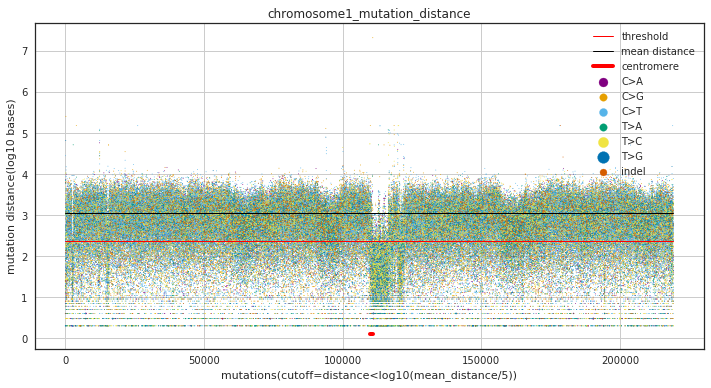

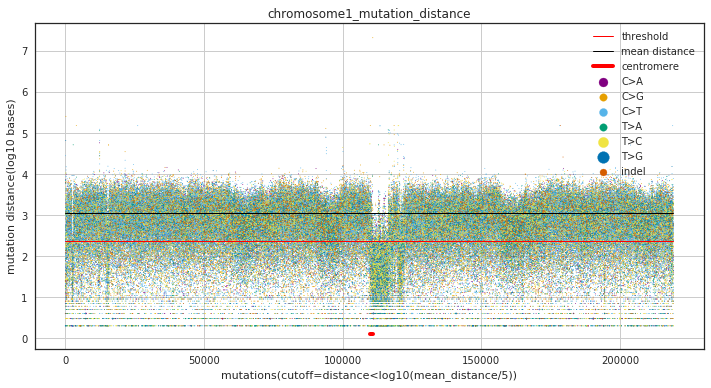

223759 223759
91000000 95700000
90519 94205
0
1
2
3
4
5
6


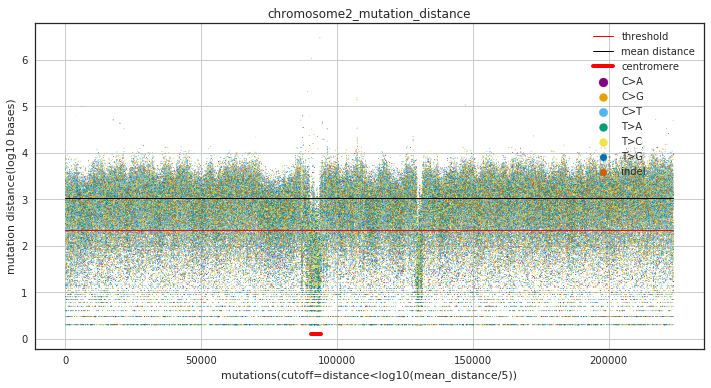

199888 199888
89400000 93200000
72958 74880
0
1
2
3
4
5
6


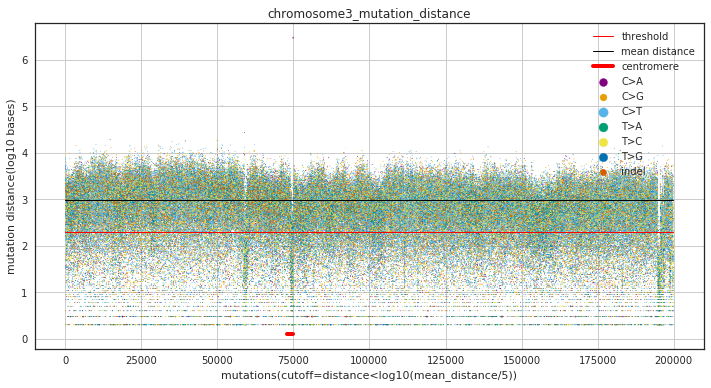

164490 164490
48700000 52400000
40179 44841
0
1
2
3
4
5
6


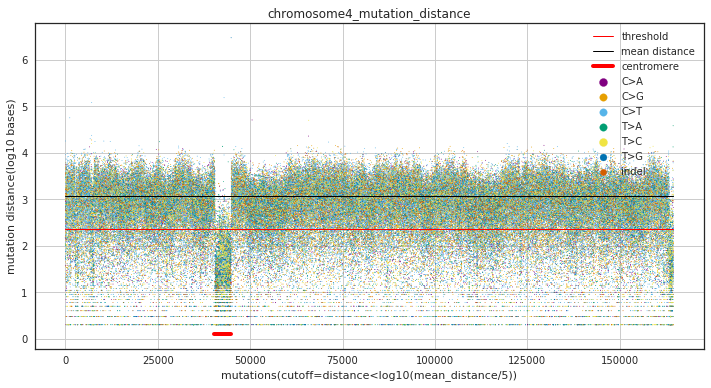

176586 176586
45800000 50500000
67514 70545
0
1
2
3
4
5
6


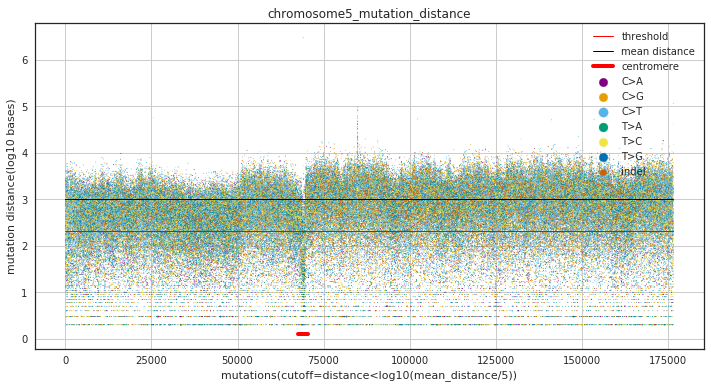

145710 145710
58400000 63400000
48397 51114
0
1
2
3
4
5
6


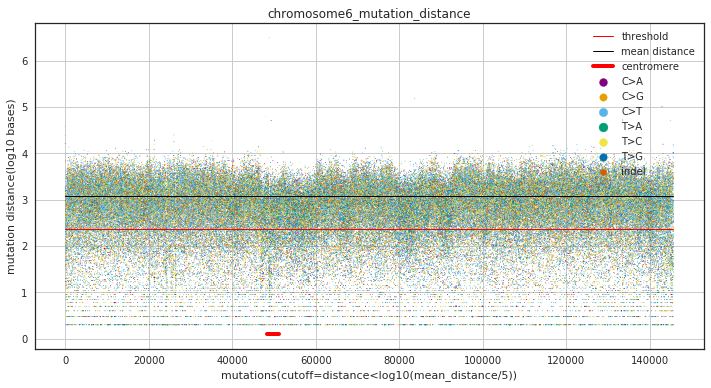

147835 147835
57400000 61100000
51782 55671
0
1
2
3
4
5
6


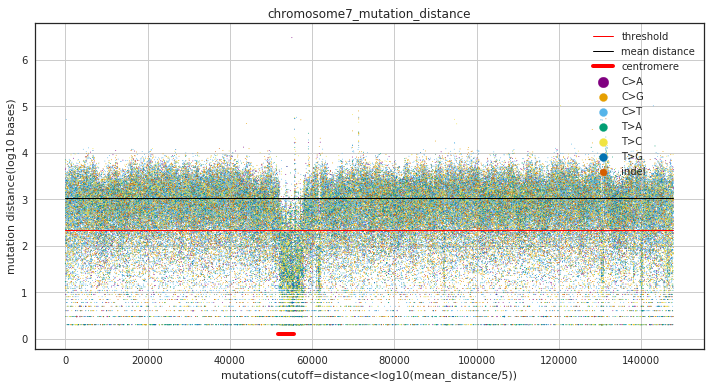

145214 145214
43200000 48100000
41321 44083
0
1
2
3
4
5
6


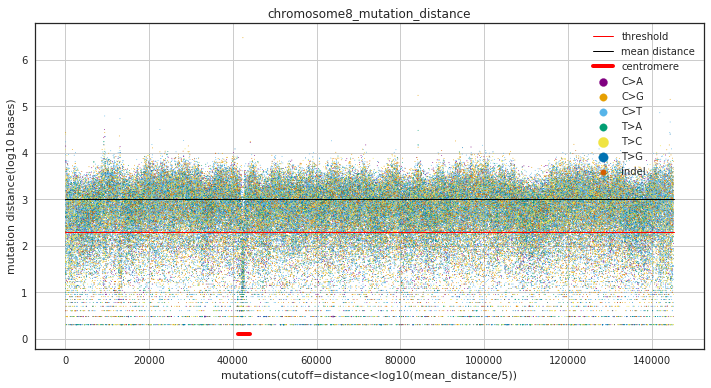

110169 110169
46700000 60300000
40839 41075
0
1
2
3
4
5
6


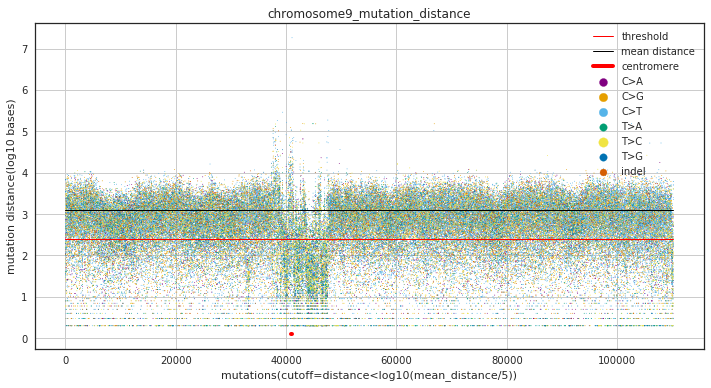

118122 118122
38800000 42100000
34439 36123
0
1
2
3
4
5
6


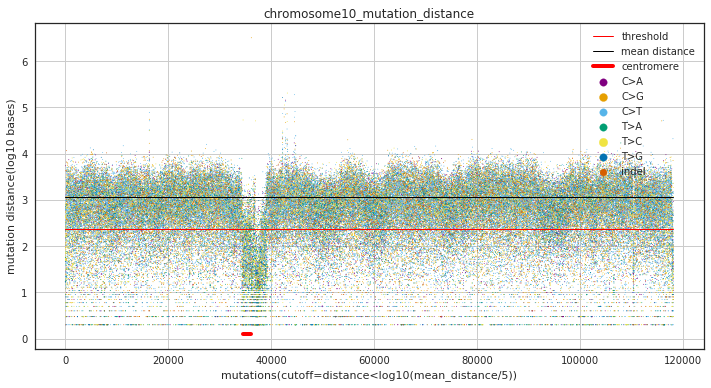

112105 112105
51400000 56400000
46763 49521
0
1
2
3
4
5
6


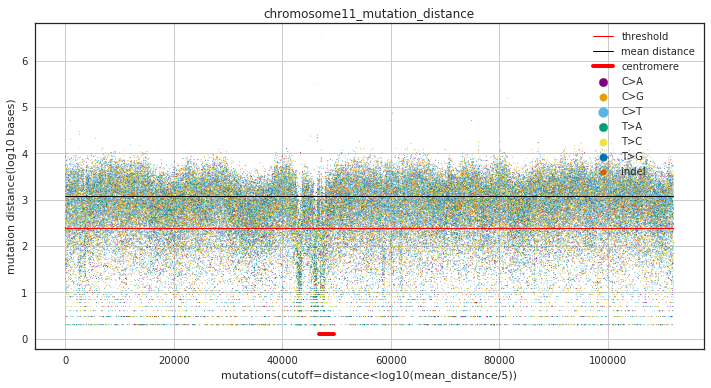

118803 118803
33200000 36500000
28546 30816
0
1
2
3
4
5
6


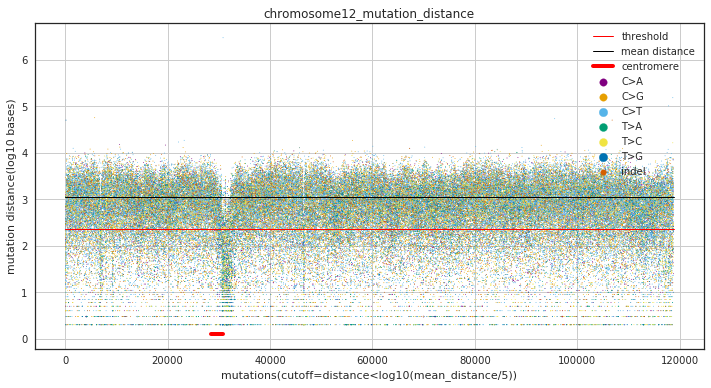

95842 95842
13500000 18400000
0 0
0
1
2
3
4
5
6


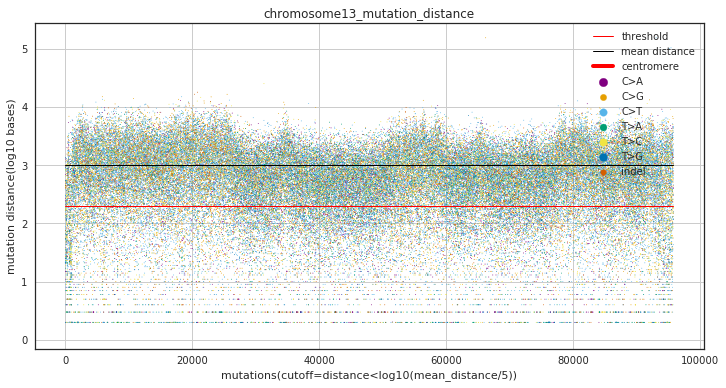

87538 87538
13600000 19100000
0 663
0
1
2
3
4
5
6


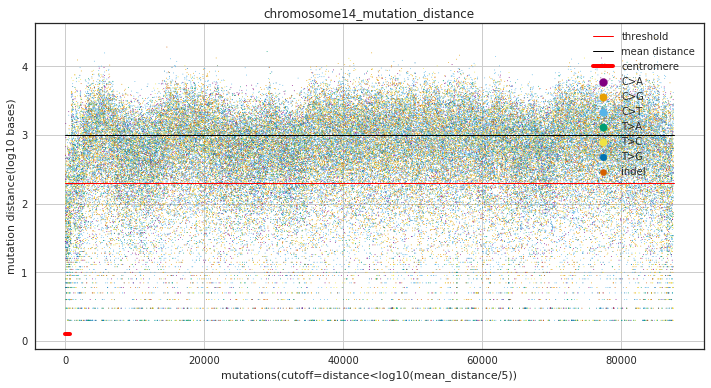

70542 70542
14100000 18400000
0 0
0
1
2
3
4
5
6


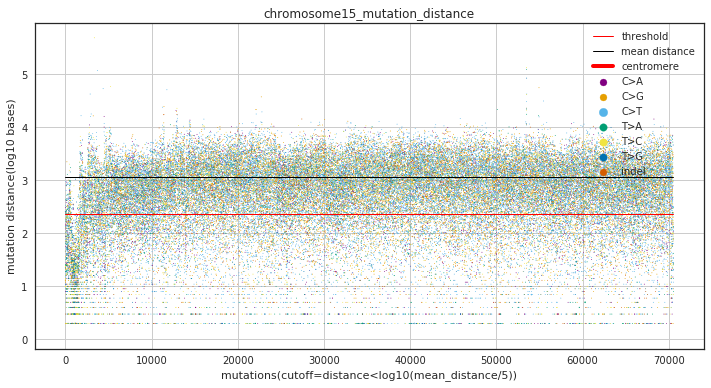

80641 80641
34400000 40700000
36979 38467
0
1
2
3
4
5
6


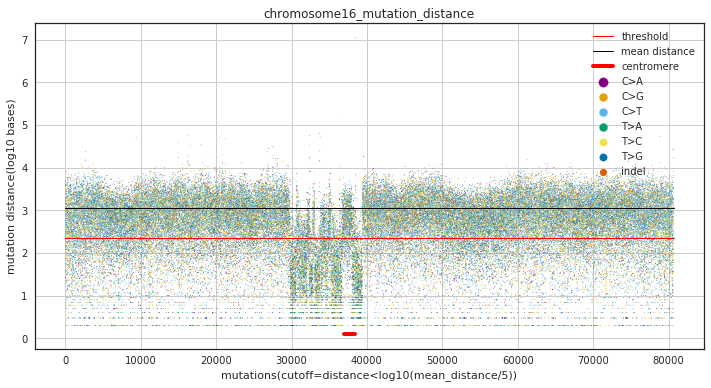

66311 66311
22100000 23200000
18550 18909
0
1
2
3
4
5
6


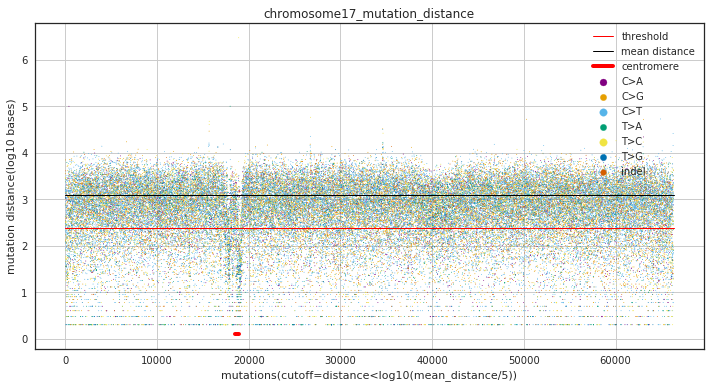

77396 77396
15400000 17300000
18287 18379
0
1
2
3
4
5
6


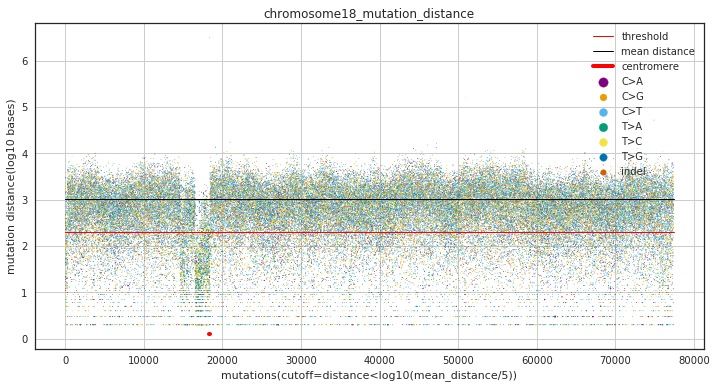

59872 59872
26700000 30200000
24219 28320
0
1
2
3
4
5
6


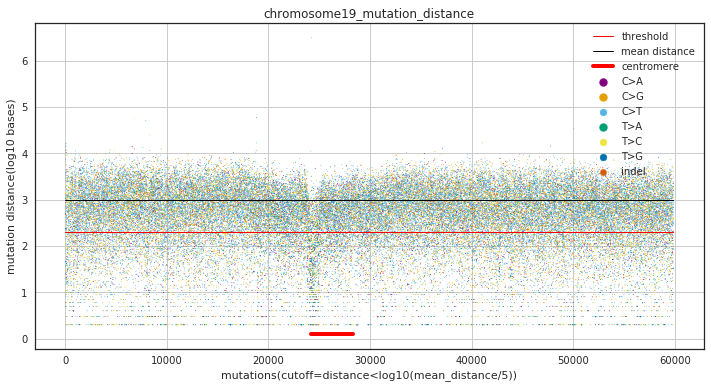

61907 61907
25700000 28400000
24177 26567
0
1
2
3
4
5
6


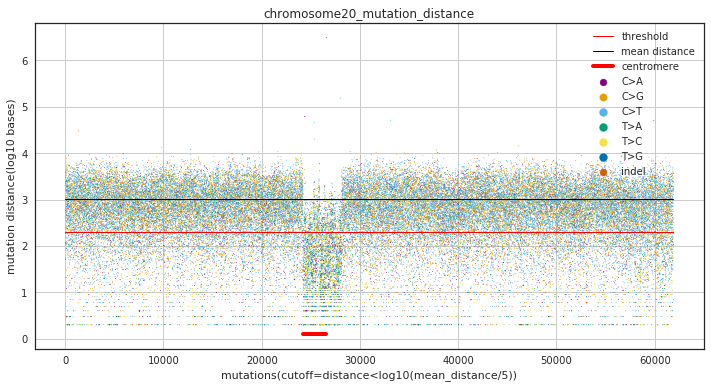

36131 36131
10000000 13200000
1947 4711
0
1
2
3
4
5
6


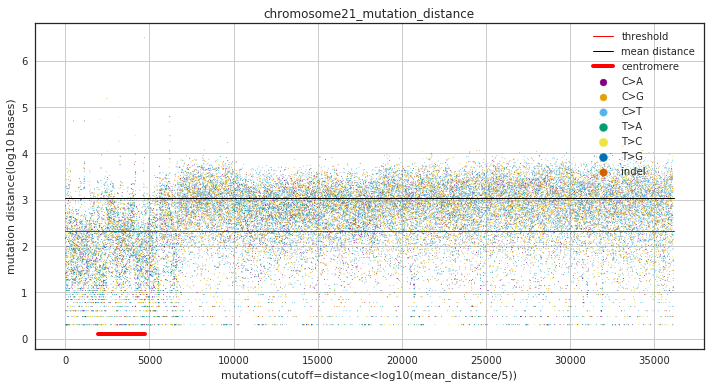

32000 32000
9600000 16300000
0 360
0
1
2
3
4
5
6


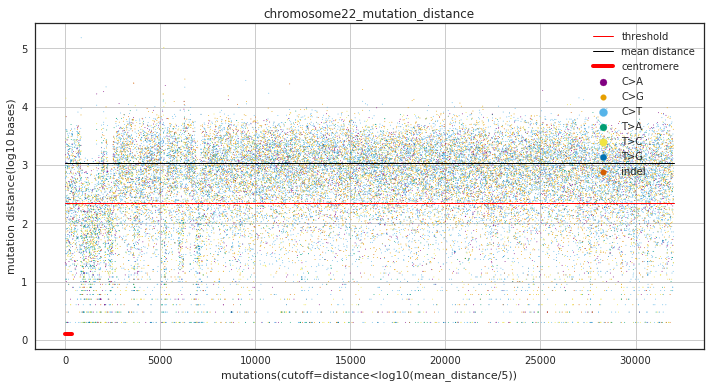

186138 186138
56600000 65000000
62192 69702
0
1
2
3
4
5
6


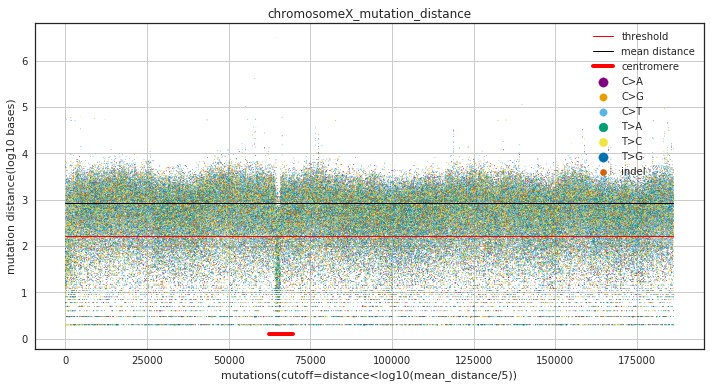

In [106]:
# new testing, combine 6 type base change together
fold_change = 5
for chrm in chromosomes:#['3']:#
    with plt.style.context("seaborn-whitegrid"):
        plt.rcParams["axes.edgecolor"] = "0.15"
        plt.rcParams["axes.linewidth"]  = 1.25
        fig = plt.figure(facecolor='w')
        ax = fig.add_subplot(111)
        
        qdf = tdf.query('chr == "{}"'.format(chrm))
        rdf = qdf.groupby(['pos', 'snv2']).chr.count().unstack()
        del rdf.index.name

#         print(rdf.head())
        snv_positions = qdf.pos.unique()
        snv_positions.sort()
        idxs = rdf.index.tolist()
        print(len(snv_positions), len(idxs))
        assert (snv_positions == idxs).all()
#         figure out the centromer position
#         df2 contains centromere coordinates
        cen_start, cen_end = locate_centromere(df2, chrm, np.array(snv_positions))
        rdf = rdf.reset_index()
#         print(rdf.head())
        shifted_positions = shift(snv_positions, 1, cval=np.nan)
        dist = (snv_positions - shifted_positions)[1:]
        avg_distance = np.mean(dist)
        xmax = len(snv_positions)
        threshold = np.log10(avg_distance/fold_change)     
#         threshold = np.log10(avg_distance)/np.log10(5*avg_distance) 
        ax.plot((0, xmax), (threshold,threshold), 'r-', linewidth=1, label='threshold')
        avg_dist = np.log10(avg_distance)
        ax.plot((0, xmax), (avg_dist,avg_dist), 'k-', linewidth=1, label='mean distance')    
        ax.plot((cen_start, cen_end), (0.1,0.1), 'r-', linewidth=4, label='centromere')
        x1 = np.arange(len(dist))
        y1 = np.log10(dist+1)    
    #     plot different types of base changes
        mut_types = rdf.columns.tolist()
        mut_types.remove('index')
    #     mut_types = ['T>G']
        for k, mtype in enumerate(mut_types):
            print(k)
            sdf = rdf[mtype][1:].to_frame()
            x2 = sdf[sdf[mtype].notnull()].index.tolist()[:-1]
            y2 = y1[x2]
            z2 = sdf.loc[x2,mtype].tolist()
            ax.scatter(x2,y2, c=colors[k], marker='.', s=z2, label=mtype)
            plt.legend(loc='upper right', markerscale=8)
        plt.title('chromosome{}_mutation_distance'.format(chrm))
        plt.xlabel('mutations(cutoff=distance<log10(mean_distance/{}))'.format(fold_change))
        plt.ylabel('mutation distance(log10 bases)')
#         plt.ylim(0,50000)
        dr = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/plots/'
        of = '{0}chromosome{1}_mutation_distance_threshold_{2}.png'.format(dr, chrm, fold_change)
        plt.savefig(of, dpi=200, bbox_inches='tight')
        plt.show()
        plt.close()

In [114]:
dist.min()

1

In [115]:
rdf.head()

snv2,index,C>A,C>G,C>T,T>A,T>C,T>G,indel
0,60258,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1,60317,NaN,NaN,1.0,NaN,NaN,NaN,NaN
2,60399,NaN,NaN,1.0,NaN,NaN,NaN,NaN
3,60455,NaN,NaN,1.0,NaN,NaN,NaN,NaN
4,61408,NaN,1.0,NaN,NaN,NaN,NaN,NaN


In [97]:
# sdf.loc[x2,]
# x2
# z2
rdf.head()
# mut_types

snv2,index,C>A,C>G,C>T,T>A,T>C,T>G,indel
0,9412435,NaN,NaN,NaN,1.0,NaN,NaN,NaN
1,9413214,NaN,NaN,NaN,NaN,1.0,NaN,NaN
2,9413224,NaN,NaN,1.0,NaN,NaN,NaN,NaN
3,9413247,NaN,NaN,NaN,NaN,2.0,NaN,NaN
4,9413275,NaN,NaN,NaN,NaN,NaN,NaN,1.0


In [110]:
rdf['total'] = rdf.sum(axis=1)
rdf.head()

snv2,C>A,C>G,C>T,T>A,T>C,T>G,indel,total
pos,,,,,,,,
9412435,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1.0
9413214,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0
9413224,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0
9413247,NaN,NaN,NaN,NaN,2.0,NaN,NaN,2.0
9413275,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0


In [123]:
rdf.head()

snv2,C>A,C>G,C>T,T>A,T>C,T>G,indel,total,pos1,pos2,distance
pos,,,,,,,,,,,
9412435,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1.0,9412435,NaN,NaN
9413214,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0,9413214,9412435.0,779.0
9413224,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,9413224,9413214.0,10.0
9413247,NaN,NaN,NaN,NaN,2.0,NaN,NaN,2.0,9413247,9413224.0,23.0
9413275,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,9413275,9413247.0,28.0


In [65]:
rdf.head()

snv2,pos,C>A,C>G,C>T,T>A,T>C,T>G,indel
0,60258,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1,60317,NaN,NaN,1.0,NaN,NaN,NaN,NaN
2,60378,NaN,NaN,1.0,NaN,NaN,NaN,NaN
3,60399,NaN,NaN,1.0,NaN,NaN,NaN,NaN
4,60455,NaN,NaN,1.0,NaN,NaN,NaN,NaN


In [48]:
# rdf[rdf.drop('pos', axis=1).sum(axis=1) >1]

In [56]:
tdf.snv2.value_counts()

C>A      2194288
C>T      1779277
T>G      1023385
T>C       614128
C>G       591721
T>A       223215
indel     100360
Name: snv2, dtype: int64

In [188]:
rdf.shape

(57301, 7)

In [192]:
shifted = rdf.shift(1)

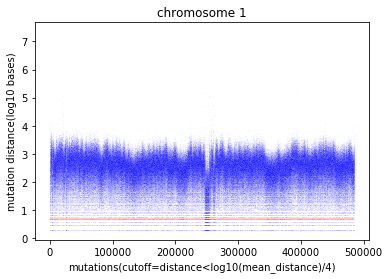

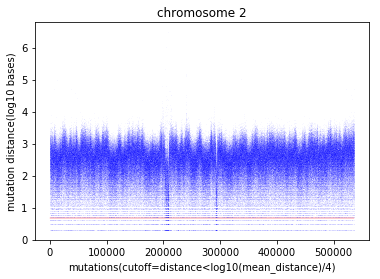

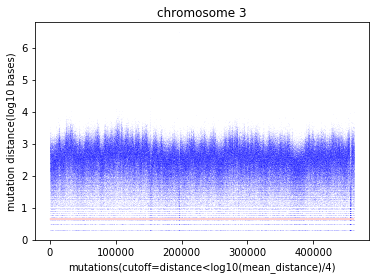

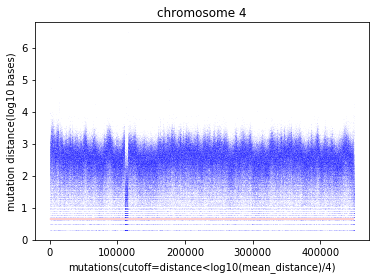

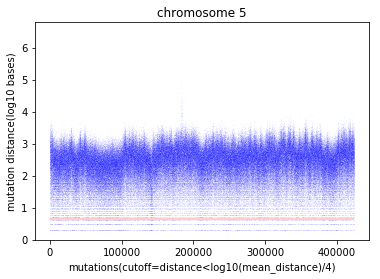

...

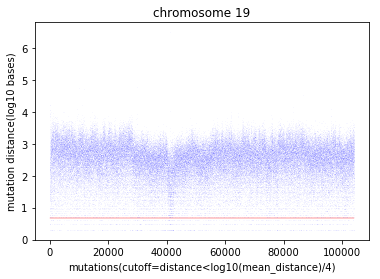

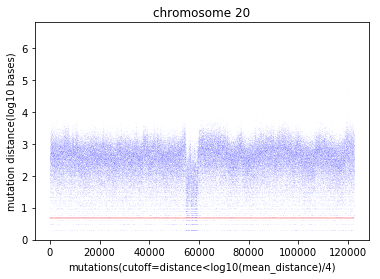

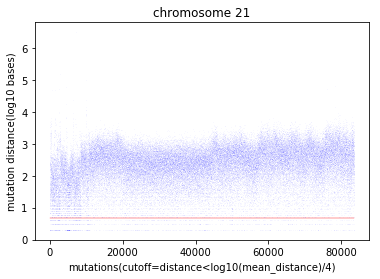

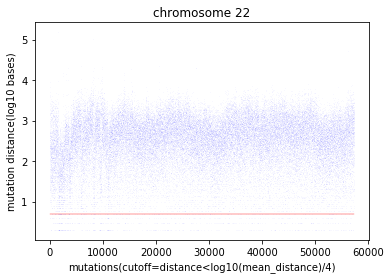

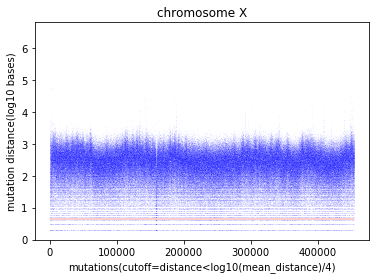

In [47]:
fold_change = 4
for chrm in chromosomes:
    qdf = cdf.query('chr == "{}"'.format(chrm))
    snv_positions = qdf.pos.unique()
    snv_positions.sort()
    shifted_positions = shift(snv_positions, 1, cval=np.nan)
    dist = (snv_positions - shifted_positions)[1:]
    avg_distance = np.mean(dist)
    xmax = len(snv_positions)
    threshold = np.log10(avg_distance)/fold_change
    plt.plot((0, xmax), (threshold,threshold), 'r-', linewidth=.4)
    
    plt.plot(np.arange(len(dist)), np.log10(dist+1), 'b.', markersize=.02)
    plt.title('chromosome{}_mutation_distance'.format(chrm))
    plt.xlabel('mutations(cutoff=distance<log10(mean_distance)/{})'.format(fold_change))
    plt.ylabel('mutation distance(log10 bases)')
    plt.title('chromosome {}'.format(chrm))

    dr = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/'
    of = '{0}chromosome{1}_mutation_distance.png'.format(dr, chrm)
    plt.savefig(of, dpi=200, bbox_inches='tight')
    plt.show()
    plt.close()

In [31]:
qdf.pos.unique()

array([16127799, 16216386, 16238635, ..., 17042175, 26392556, 33643061])

In [32]:
m_arr

array([16050353, 16050645, 16051133, ..., 51236665, 51237364, 51240754])

In [33]:
sm_arr

array([-9223372036854775808,             16050353,             16050645,
       ...,             51236557,             51236665,
                   51237364])

In [34]:
dist

array([ 292,  488,  512, ...,  108,  699, 3390])

In [36]:
np.mean(dist)

614.14312390924954

In [62]:
m_arr = np.array([2, 6,7,12])

In [31]:
tdf.head()

,chr,pos,ref,alt,eff
HTMCP-03-06-02354,1,104339,T,C,INTRON
HTMCP-03-06-02354,1,234775,C,T,DOWNSTREAM
HTMCP-03-06-02354,1,757812,G,T,DOWNSTREAM
HTMCP-03-06-02354,1,757817,C,T,DOWNSTREAM
HTMCP-03-06-02354,1,757821,T,C,DOWNSTREAM


snv2      C>A  C>G  C>T  T>A  T>C
pos                              
16127799  NaN  NaN  NaN  NaN  1.0
16216386  1.0  NaN  NaN  NaN  NaN
16238635  NaN  NaN  NaN  NaN  1.0
16249129  NaN  NaN  1.0  NaN  NaN
16288434  NaN  NaN  1.0  NaN  NaN
20 20


/home/szong/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


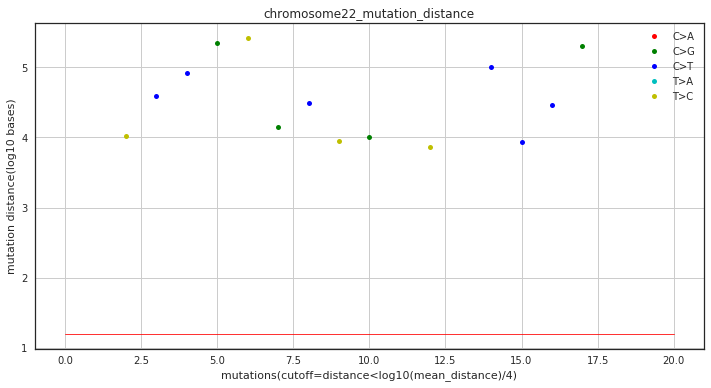

In [44]:
fold_change = 4
for chrm in ['22']:#chromosomes:
    with plt.style.context("seaborn-whitegrid"):
        plt.rcParams["axes.edgecolor"] = "0.15"
        plt.rcParams["axes.linewidth"]  = 1.25
        fig = plt.figure(facecolor='w')
        ax = fig.add_subplot(111)
        
    qdf = tdf.query('chr == "{}"'.format(chrm)).head(20)
    rdf = qdf.groupby(['pos', 'snv2']).chr.count().unstack()
    print(rdf.head())
    snv_positions = qdf.pos.unique()
    snv_positions.sort()
    idxs = rdf.index.tolist()
    print(len(snv_positions), len(idxs))
    assert (snv_positions == idxs).all()
    rdf = rdf.reset_index()
    shifted_positions = shift(snv_positions, 1, cval=np.nan)
    dist = (snv_positions - shifted_positions)[1:]
    avg_distance = np.mean(dist)
    xmax = len(snv_positions)
    threshold = np.log10(avg_distance)/fold_change
    ax.plot((0, xmax), (threshold,threshold), 'r-', linewidth=.8)
    x1 = np.arange(len(dist))
    y1 = np.log10(dist+1)
#     ax.plot(x1, y1, 'w.', markersize=.2)
    
#     plot different types of base changes
    mut_types = rdf.columns.tolist()
    mut_types.remove('pos')
    mut_types
    for k, mtype in enumerate(mut_types):
        sdf = rdf[mtype][1:].to_frame()
        x2 = sdf[sdf[mtype].notnull()].index.tolist()[:-1]
        y2 = y1[x2]
        ax.plot(x2, y2, colors[k], ms=10, label=mtype)
        plt.legend(loc='upper right', markerscale=1)
    plt.title('chromosome{}_mutation_distance'.format(chrm))
    plt.xlabel('mutations(cutoff=distance<log10(mean_distance)/{})'.format(fold_change))
    plt.ylabel('mutation distance(log10 bases)')


    dr = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/test/'
    of = '{0}chromosome{1}_mutation_distance.png'.format(dr, chrm)
#     plt.savefig(of, dpi=200, bbox_inches='tight')
    plt.show()
    plt.close()

# enhancer annotation

In [3]:
genehancer = '/home/szong/Downloads/genehancer.xlsx'
df1 = pd.read_excel(genehancer)

In [21]:
df1.head()

,chrom,source,feature name,start,end,score,strand,frame,attributes
0,chr22,GeneHancer,Enhancer,25191646,25191697,0.27,.,.,genehancer_id=GH22H025191;connected_gene=GC22P...
1,chr10,GeneHancer,Enhancer,36278128,36278746,0.25,.,.,genehancer_id=GH10H036278;connected_gene=GC10M...
2,chr4,GeneHancer,Enhancer,141347800,141349400,1.02,.,.,genehancer_id=GH04H141347;connected_gene=LINC0...
3,chr6,GeneHancer,Enhancer,36141287,36142442,0.36,.,.,genehancer_id=GH06H036141;connected_gene=MAPK1...
4,chr4,GeneHancer,Enhancer,184644792,184651047,1.32,.,.,genehancer_id=GH04H184644;connected_gene=CENPU...


In [30]:
df = df1.drop(['feature name', 'source','strand', 'frame'], axis=1)

In [28]:
df.head()

,chrom,start,end,score,attributes
0,chr22,25191646,25191697,0.27,genehancer_id=GH22H025191;connected_gene=GC22P...
1,chr10,36278128,36278746,0.25,genehancer_id=GH10H036278;connected_gene=GC10M...
2,chr4,141347800,141349400,1.02,genehancer_id=GH04H141347;connected_gene=LINC0...
3,chr6,36141287,36142442,0.36,genehancer_id=GH06H036141;connected_gene=MAPK1...
4,chr4,184644792,184651047,1.32,genehancer_id=GH04H184644;connected_gene=CENPU...


In [31]:
df['enhancerid'] = df.attributes.apply(lambda x: x.split('=')[1].split(';')[0])
df['connected_genes_tmp'] = df.attributes.apply(lambda x: [i.split('=')[1] for i in x.split(';') if 'connected_gene' in i])
df['num_targets'] = df.connected_genes_tmp.apply(lambda x: len(x))
df['connected_genes'] = df['connected_genes_tmp'].apply(lambda x: ';'.join(x))
df = df.drop(['connected_genes_tmp','attributes'], axis=1)
df['chrom'] = df.chrom.str.replace('chr', '')
df.head()

,chrom,start,end,score,enhancerid,num_targets,connected_genes
0,22,25191646,25191697,0.27,GH22H025191,3,GC22P025196;PIR34921;LOC101232810
1,10,36278128,36278746,0.25,GH10H036278,2,GC10M036292;ENSG00000227475
2,4,141347800,141349400,1.02,GH04H141347,4,LINC02432;IL15;ZNF330;ENSG00000250189
3,6,36141287,36142442,0.36,GH06H036141,4,MAPK13;GC06P041162;PIR48318;BRPF3
4,4,184644792,184651047,1.32,GH04H184644,6,CENPU;ACSL1;IRF2;PRIMPOL;CASP3;LINC02365


In [83]:
# df = df.drop('chrom', axis=1)

In [32]:
df = df.sort_values('chrom', ascending=True)

In [33]:
of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/genehancer_annotation.txt'
df.to_csv(of, index=False, sep='\t')

In [34]:
df.head()

,chrom,start,end,score,enhancerid,num_targets,connected_genes
152724,1,20119401,20119600,0.43,GH01H020119,2,PLA2G2D;LOC100419911
216559,1,193257370,193258002,0.41,GH01H193257,4,B3GALT2;RGS2;PIR40263;LINC01031
233468,1,236905001,236905601,1.28,GH01H236905,6,ENSG00000273058;MTR;ENSG00000230325;HEATR1;LOC...
158329,1,226121001,226126202,1.61,GH01H226121,9,H3F3A;RPL34P7;ACBD3-AS1;MIXL1;SDE2;LIN9;LINC01...
188226,1,237891384,237893029,0.25,GH01H237891,2,ZP4;ENSG00000243781


# determine hotspot regions based on intermutational distance

In [116]:
# of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/non_coding_mutations_107_patients.txt'
of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/non_coding_mutations_121_patients.txt'
df = pd.read_csv(of, sep='\t')
df.head()

/home/szong/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Unnamed: 0,chr,pos,ref,alt,eff,snv1,snv2
0,HTMCP-03-06-02001,1,59734,A,G,INTERGENIC,A>G,T>C
1,HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM,G>A,C>T
2,HTMCP-03-06-02001,1,737454,G,C,DOWNSTREAM,G>C,C>G
3,HTMCP-03-06-02001,1,757477,T,C,DOWNSTREAM,T>C,T>C
4,HTMCP-03-06-02001,1,758253,G,A,DOWNSTREAM,G>A,C>T


In [117]:
# count regions labelled as True/False with a distance less than threshold
def find_consecutive_regions(s, cth): #cth = count_threshold
    idx = 0
    out = []
    regions = []
    for k, g in groupby(s):
        element = next(g)
        nelements = len(list(g)) + 1
        if element and nelements > cth:
            l_nidx = idx
            h_nidx = idx + nelements -1
            l_idx = s.index[l_nidx]
            h_idx = s.index[h_nidx]
            rlen = h_idx - l_idx
            out.append((k, nelements, idx))
            regions.append([l_idx, h_idx, rlen, nelements])
        idx += nelements        
#     print(out)
#     print(regions)
    return regions
    
num = 1
s = pd.Series([False, True,True,True,False,False,True,True,False,True, False],
              index = [2,4,8,10,15, 16, 19, 22, 23,25,26])
# find_consecutive_regions(s, num)
assert find_consecutive_regions(s, num) == [[4, 10, 6, 3], [19, 22, 3, 2]]



In [118]:
count_threshold = 15
distance_threshold = 0.2
rdf = pd.DataFrame()
for chrm in chromosomes:#['X']:#
    qdf = df.query('chr == "{}"'.format(chrm))
    qdf = qdf.sort_values('pos')
#     print(qdf.head())
    qdf['shift_pos'] = qdf.pos.shift(1)
    qdf['distance'] = qdf.pos - qdf.shift_pos
    avg_distance = qdf.distance.mean()
    qdf['status'] = qdf.distance < distance_threshold * avg_distance
    print(chrm, avg_distance)
    qdf = qdf.set_index('pos')
#     print([ sum( 1 for x in group ) for key, group in itertools.groupby(qdf.status) if key])
    regions = find_consecutive_regions(qdf.status, count_threshold)
    odf = pd.DataFrame(regions, columns= ['start', 'end', 'region_length', 'number_non_coding_variants'])
    odf.insert(0, column='chr', value=chrm) 
    if rdf.empty:
         rdf = odf
    else:
        rdf = pd.concat([rdf, odf], axis=0)
rdf['region_mutation_rate_Mb'] = rdf.number_non_coding_variants/rdf.region_length * 1000000

dir = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/'
of = '{0}/{1}_distance_{2}_count_{3}.txt'.format(dir, 'intermutational_distance_analysis_mutation', distance_threshold, count_threshold)
rdf.to_csv(of, sep='\t', index=False)
print(rdf)

1 1104.895388994055
2 1060.8137004707
3 970.8867719935233
4 1137.8252468819612
5 1081.9344055408687
6 1269.3522925561538
7 1143.9057530267737
8 1102.1181593539054
9 1381.2479154433354
10 1234.9275894761793
11 1312.8555350014603
12 1213.9284508729265
13 1028.719332805173
14 1031.5225666249955
15 1193.881394675926
16 1119.5529293530856
17 1253.5696816230738
18 1025.5144216864303
19 1003.3876448401237
20 1018.3513299120947
21 1065.7618326495774
22 1083.1481732278617
X 818.9822483021377
   chr      start        end  region_length  number_non_coding_variants  \
0    1      10321      10543            222                          16   
1    1     536090     536366            276                          21   
2    1     725020     726334           1314                          39   
3    1     831283     832212            929                          20   
4    1    1034225    1035272           1047                          16   
5    1    2609065    2609338            273                   

In [316]:
# mutational distance hotspot length
rdf.region_length.sum()

1488681

# remove centromeres

/home/rcorbett/aligners/bedtools/BEDTools-Version-2.15.0/bin/bedtools subtract -f 0.1 -a windowsize_2000_stride_200_threshold_10x_mutation_rate.txt -b /home/szong/projects/resource/centromere.pos.4.bedtools.txt

In [298]:
rdf.mean()

start                         6.809482e+07
end                           6.809592e+07
region_length                 1.100345e+03
number_non_coding_variants    3.052591e+01
region_mutation_rate_Mb                inf
dtype: float64

In [290]:
avg_distance

1476.6457195307603

In [291]:
qdf.shape

(134005, 10)

In [301]:
rdf.sum()

chr                           1111111111111111111111111111111111111111111111...
start                                                               89340397474
end                                                                 89341841127
region_length                                                           1443653
number_non_coding_variants                                                40050
region_mutation_rate_Mb                                                     inf
dtype: object

In [76]:

# figure out consecutive conditions
import itertools
condition = [False, True,True,True,False,False,True,True,False,True, True]
[ sum( 1 for x in group ) for key, group in itertools.groupby( condition ) if key]

[3, 2, 2]

In [241]:
# qdf.groupby(level=0).filter(lambda x: len(x) > 1)



l_idx 1 3 4 10
l_idx 6 7 19 22
[(True, 3, 1), (True, 2, 6)]
[[4, 10, 3], [19, 22, 2]]
l_idx 1 3 4 10
l_idx 6 7 19 22
[(True, 3, 1), (True, 2, 6)]
[[4, 10, 3], [19, 22, 2]]


In [141]:
# get series index
myseries = pd.Series([1,4,0,7,5], index=[0,1,21,31,41])
idx = myseries[myseries <= 7].index
print(idx, idx[0],idx[-1])

Int64Index([0, 1, 21, 31, 41], dtype='int64') 0 41


In [146]:
myseries.index[3]

31

In [81]:
for key, group in itertools.groupby( condition ):
    print(key)
    print(group)

False
True
False
True
False
True


# length of hotspots

In [323]:
f = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/sliding_window_mutaional_distance_merged_overlap_promoter_txn_factor_merged.txt'
df = pd.read_csv(f, header=None,sep='\t')
df.head()

,0,1,2
0,1,10089,10578
1,1,16132,16352
2,1,534400,534545
3,1,825798,826272
4,1,1649224,1649480


In [324]:
df['length'] = df[2] - df[1]
df.head()

,0,1,2,length
0,1,10089,10578,489
1,1,16132,16352,220
2,1,534400,534545,145
3,1,825798,826272,474
4,1,1649224,1649480,256


In [325]:
df.length.sum()

288072

In [74]:
# f10 = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/windowsize_2000_stride_200_threshold_5x_mutation_rate.h5.repeat.centromere_removed'
# df10 = pd.read_csv(f10, sep='\t', header=None)
# df10['len'] = df10[2] -df10[1]
# df10.head()

,0,1,2,len
0,1,15600,17599,1999
1,1,535400,537999,2599
2,1,723400,728199,4799
3,1,757000,759399,2399
4,1,824200,826999,2799


In [326]:
# f11 = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/123_patients/intermutational_distance_analysis_mutation_distance_0.2_count_15.txt'
# # f11 = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/intermutational_distance_analysis_mutation_distance_0.2_count_15.centromere_removed.txt'
# df11 = pd.read_csv(f11, sep='\t')
# df11['len'] = df11[2] -df11[1]
# df11.head()

In [86]:
# df10[(df10[0] == 2)&(df10[1]== 132528385)]

,0,1,2,len


/home/szong/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


CPU times: user 1.05 s, sys: 44 ms, total: 1.09 s
Wall time: 1.36 s


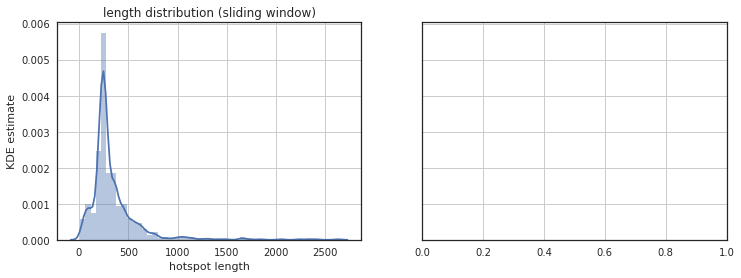

In [329]:
with plt.style.context("seaborn-whitegrid"):
    plt.rcParams["axes.edgecolor"] = "0.15"
    plt.rcParams["axes.linewidth"]  = 1.25

    fig, axes = plt.subplots(1, 2, facecolor='w', figsize=(12,4), sharey=True)
    ttls = ['sliding window', 'intermutational distance']
    for k, df in enumerate([df]):
        ax = axes[k]
        sns.distplot(df['length'].astype(float), hist=True, rug=False, ax=ax)     
        ax.set_title('length distribution ({})'.format(ttls[k]))
        ax.set_xlabel('hotspot length')
        ax.set_ylabel('KDE estimate')
#         ax.set_xlim(0, 50000)

    
of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/hotspot_length_distribution.png'
%time plt.savefig(of, bbox_inches='tight',dpi=200)
plt.show()
plt.close()

/home/rcorbett/aligners/bedtools/BEDTools-Version-2.15.0/bin/bedtools intersect -a intermutational_distance_analysis_mutation_distance_0.2_count_15.centromere_removed.txt -b dnase_sensitive_region_potential_promoters.txt -wa -wb

In [145]:
tdf.head()

,chr,pos,ref,alt,eff,snv1,snv2
HTMCP-03-06-02001,1,59734,A,G,INTERGENIC,A>G,T>C
HTMCP-03-06-02001,1,694016,G,A,DOWNSTREAM,G>A,C>T
HTMCP-03-06-02001,1,737454,G,C,DOWNSTREAM,G>C,C>G
HTMCP-03-06-02001,1,757477,T,C,DOWNSTREAM,T>C,T>C
HTMCP-03-06-02001,1,758253,G,A,DOWNSTREAM,G>A,C>T


In [149]:
# tdf.reset_index()

In [169]:
odf = tdf.reset_index().groupby(['chr', 'pos', 'snv2'])['index'].count().unstack()

In [170]:
odf['mutations'] = odf.sum(axis=1)

In [171]:
odf.index.names

FrozenList(['chr', 'pos'])

In [172]:
odf = odf.reset_index()

In [173]:
odf.head()

snv2,chr,pos,C>A,C>G,C>T,T>A,T>C,T>G,indel,mutations
0,1,74640964,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0
1,1,74641052,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0
2,1,74641082,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0
3,1,74641615,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0
4,1,74641919,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0


In [174]:
odf['pos2'] = shift(odf.pos, 1, cval=np.nan)

In [175]:
odf['distance'] = odf.pos - odf.pos2

In [176]:

odf.head()

snv2,chr,pos,C>A,C>G,C>T,T>A,T>C,T>G,indel,mutations,pos2,distance
0,1,74640964,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,-9223372036854775808,-9223372036780134844
1,1,74641052,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,74640964,88
2,1,74641082,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0,74641052,30
3,1,74641615,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,74641082,533
4,1,74641919,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,74641615,304


# how many patients contribute to each hotspot region

/home/rcorbett/aligners/bedtools/BEDTools-Version-2.15.0/bin/bedtools intersect -a windowsize_2000_stride_200_threshold_5x_mutation_rate.h5.repeat.centromere_removed -b non_coding_mutations.bed -wa -wb |cut -f 1-3,7|sort -u>windowsize_2000_stride_200_threshold_5x_mutation_rate.h5.repeat.centromere_removed.intersected_with_non_coding_mutations.txt

In [252]:
f = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/windowsize_2000_stride_200_threshold_5x_mutation_rate.h5.repeat.centromere_removed.intersected_with_non_coding_mutations.txt'
df = pd.read_csv(f, sep='\t', header=None)
df.columns = ['chr', 'start', 'end', 'patient']
df.head()

,chr,start,end,patient
0,10,112600,114799,HTMCP-03-06-02007
1,10,112600,114799,HTMCP-03-06-02037
2,10,112600,114799,HTMCP-03-06-02054
3,10,112600,114799,HTMCP-03-06-02075
4,10,112600,114799,HTMCP-03-06-02103


In [232]:
df1 = df.groupby(['chr', 'start', 'end'])['patient'].count().reset_index()
df1.shape

(993, 4)

In [233]:
df1['region'] = df1[['chr', 'start', 'end']].apply(lambda x: ':'.join(x.astype(str)), axis=1)

In [234]:
df2 = df1.sort_values('patient', ascending=False)
df2.head(2)

,chr,start,end,patient,region
424,10,42600400,42628799,107,10:42600400:42628799
569,15,20100200,20149399,107,15:20100200:20149399


look at intermutational distribution

In [235]:
f = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/intermutational_distance_analysis_mutation_distance_0.2_count_15.centromere_removed.intersect_with_non_coding_mutations.txt'
df3 = pd.read_csv(f, sep='\t', header=None)
df3.columns = ['chr', 'start', 'end', 'a', 'b', 'c', 'patient']
df3.head()

,chr,start,end,a,b,c,patient
0,10,122492567,122493475,908,45,49559.471366,HTMCP-03-06-02001
1,10,122492567,122493475,908,45,49559.471366,HTMCP-03-06-02003
2,10,122492567,122493475,908,45,49559.471366,HTMCP-03-06-02007
3,10,122492567,122493475,908,45,49559.471366,HTMCP-03-06-02008
4,10,122492567,122493475,908,45,49559.471366,HTMCP-03-06-02040


In [236]:
df4 = df3.groupby(['chr', 'start', 'end'])['patient'].count().reset_index()
df4.shape

(987, 4)

In [237]:
df4['region'] = df4[['chr', 'start', 'end']].apply(lambda x: ':'.join(x.astype(str)), axis=1)

In [238]:
df4 = df4.sort_values('patient', ascending=False)
df4.head(2)

,chr,start,end,patient,region
292,15,20121123,20125787,93,15:20121123:20125787
322,16,32132560,32139297,88,16:32132560:32139297


/home/szong/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


CPU times: user 1.22 s, sys: 26 ms, total: 1.25 s
Wall time: 1.27 s


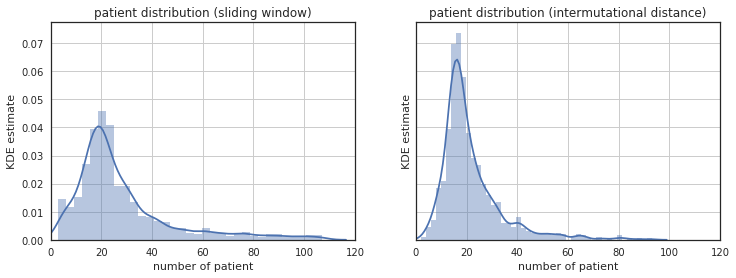

In [239]:
with plt.style.context("seaborn-whitegrid"):
    plt.rcParams["axes.edgecolor"] = "0.15"
    plt.rcParams["axes.linewidth"]  = 1.25

    fig, axes = plt.subplots(1, 2, facecolor='w', figsize=(12,4), sharey=True)
    ttls = ['sliding window', 'intermutational distance']
    for k, df in enumerate([df2, df4]):
        ax = axes[k]
        sns.distplot(df['patient'].astype(float), hist=True, rug=False, ax=ax)     
        ax.set_title('patient distribution ({})'.format(ttls[k]))
        ax.set_xlabel('number of patient')
        ax.set_ylabel('KDE estimate')
        ax.set_xlim(0, 120)

    
of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/hotspot_patient_distribution.png'
%time plt.savefig(of, bbox_inches='tight',dpi=200)
plt.show()
plt.close()

# any hotspots enriched with HIV+ or - patients

In [266]:
df3.head(2)

,chr,start,end,a,b,c,patient
0,10,122492567,122493475,908,45,49559.471366,HTMCP-03-06-02001
1,10,122492567,122493475,908,45,49559.471366,HTMCP-03-06-02003


In [253]:
df.head(2)

,chr,start,end,patient
0,10,112600,114799,HTMCP-03-06-02007
1,10,112600,114799,HTMCP-03-06-02037


In [267]:
# add in hiv status and histology
f22 ='/projects/trans_scratch/validations/workspace/szong/Cervical/variant_bwamem/124_patients/mutation_load_clinic.txt'
df22 = pd.read_csv(f22, sep='\t')
df22 = df22[['patient', 'HIV_status', 'Putative_histology']]
# df22 = df22.set_index('patient')#.stack().reset_index()
df22.head(2)

,patient,HIV_status,Putative_histology
0,HTMCP-03-06-02001,Positive,Squamous
1,HTMCP-03-06-02002,Negative,Squamous


In [268]:
df33 = pd.merge(df3, df22, left_on='patient', right_on='patient')
df33.head(2)

,chr,start,end,a,b,c,patient,HIV_status,Putative_histology
0,10,122492567,122493475,908,45,49559.471366,HTMCP-03-06-02001,Positive,Squamous
1,10,135449412,135450596,1184,22,18581.081081,HTMCP-03-06-02001,Positive,Squamous


In [269]:
hiv_cnts = df33[['patient', 'HIV_status']].drop_duplicates()['HIV_status'].value_counts()
npos = hiv_cnts['Positive']
nneg = hiv_cnts['Negative']

In [270]:
print(npos, nneg)

57 49


In [271]:
d = {}
for n, g in df33.groupby(['chr', 'start', 'end'])[['patient', 'HIV_status']]:
#     print(n)
    c = pd.Series(g[['patient', 'HIV_status']].drop_duplicates()['HIV_status'].value_counts())
    d[n] = c
# print(d)
df = pd.DataFrame(d).T.reset_index().fillna(0)
df.head()

,level_0,level_1,level_2,Negative,Positive
0,1,536123,536366,5.0,8.0
1,1,725020,725816,4.0,10.0
2,1,726033,726378,9.0,7.0
3,1,831283,832212,8.0,6.0
4,1,2615552,2616452,4.0,11.0


In [163]:
# df.Negative.sort_values()

In [ ]:
# use fisher exact test to see if any hotspot is enriched with HIV+ or - patients
# contingency table:
#                                       HIV+     HIV-
# num_patients with hotspot muts:       8         5 
# num_patients without hotspot muts:    npos-8   nneg-5   

# oddsratio, pvalue = stats.fisher_exact([[11, 11], [63, 38]])
# print(pvalue)

In [272]:
def fisher(np, nn, npos, nneg):
    oddsratio, p = stats.fisher_exact([[np, nn], [npos-np, nneg-nn]])
    return p

def calculate_fisher_pvalue(df):
    df['pvalue'] = df[['Positive', 'Negative']]\
    .apply(lambda x: fisher(x['Positive'], x['Negative'], npos, nneg ),axis=1)

calculate_fisher_pvalue(df)

In [273]:
df.head(2)

,level_0,level_1,level_2,Negative,Positive,pvalue
0,1,536123,536366,5.0,8.0,0.767672
1,1,725020,725816,4.0,10.0,0.249474


In [274]:
df[df.pvalue<0.05].shape

(60, 6)

In [275]:
# df_sliding = df.copy()
df_dist = df.copy()

In [276]:
df_dist.head(2)

,level_0,level_1,level_2,Negative,Positive,pvalue
0,1,536123,536366,5.0,8.0,0.767672
1,1,725020,725816,4.0,10.0,0.249474


In [262]:
df_sld = df.copy()

In [264]:
df_sld.head()

,level_0,level_1,level_2,Negative,Positive,pvalue
0,1,15600,17599,10.0,5.0,0.100849
1,1,535400,537999,8.0,9.0,1.000000
2,1,723400,728199,20.0,18.0,0.416853
3,1,757000,759399,7.0,8.0,1.000000
4,1,824200,826999,10.0,6.0,0.181872


In [250]:
df.head()

,level_0,level_1,level_2,Negative,Positive,pvalue
0,1,536123,536366,5.0,8.0,0.767672
1,1,725020,725816,4.0,10.0,0.249474
2,1,726033,726378,9.0,7.0,0.424583
3,1,831283,832212,8.0,6.0,0.404286
4,1,2615552,2616452,4.0,11.0,0.161144


In [283]:
df[df.pvalue < 0.01]

,level_0,level_1,level_2,Negative,Positive,pvalue
43,1,142686301,142686933,13.0,3.0,0.002710
49,1,142959999,142960277,16.0,6.0,0.007569
83,1,143476886,143477752,13.0,4.0,0.007946
141,10,42671763,42672525,16.0,6.0,0.007569
189,11,50730204,50731124,16.0,5.0,0.002949
313,16,32095270,32095799,17.0,5.0,0.001483
321,16,32127801,32128912,13.0,4.0,0.007946
503,2,90438572,90439281,2.0,13.0,0.009928
522,2,132764608,132764947,13.0,4.0,0.007946
584,20,29636952,29637654,13.0,2.0,0.001324


/home/szong/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


CPU times: user 1.44 s, sys: 28 ms, total: 1.47 s
Wall time: 1.47 s


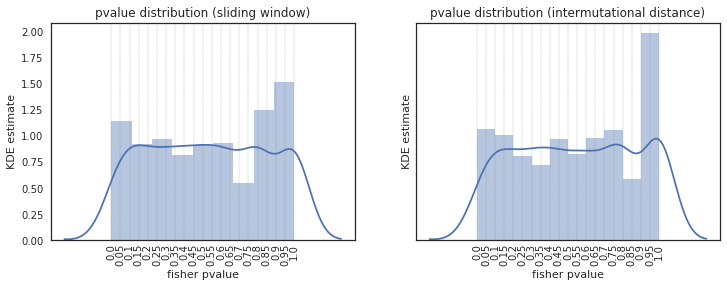

In [282]:
# hotspot pvalue distribution 60 regions with pvalue < 0.05
with plt.style.context("seaborn-whitegrid"):
    plt.rcParams["axes.edgecolor"] = "0.15"
    plt.rcParams["axes.linewidth"]  = 1.25

    fig, axes = plt.subplots(1, 2, facecolor='w', figsize=(12,4), sharey=True)
    ttls = ['sliding window', 'intermutational distance']
    for k, df in enumerate([df_sld, df_dist]):

        ax = axes[k]
        sns.distplot(df['pvalue'].astype(float), hist=True, rug=False, ax=ax)     
        ax.set_title('pvalue distribution ({})'.format(ttls[k]))
        ax.set_xlabel('fisher pvalue')
        ax.set_ylabel('KDE estimate')
        ax.set_xticks(np.arange(0,1.05, 0.05), minor=True)
        ax.set_xticklabels(np.arange(0,1.05, 0.05),minor=True, fontsize=10)
        plt.setp(ax.xaxis.get_minorticklabels(), rotation=90)

#         this controls the ticks
        ax.tick_params(
            axis='x',          # changes apply to the x-axis
            which='major',      # both major and minor ticks are affected
            bottom='off',      # ticks along the bottom edge are off
            top='off',         # ticks along the top edge are off
            labelbottom='off') # labels along the bottom edge are off  

        
            # Gridlines based on minor ticks
        _ = ax.grid(b=True, which='minor', color='gray', linestyle='--', linewidth=0.3)
        # hide major tick grid
        _ = ax.grid(b=True, which='major', color='r', linestyle='-', linewidth=0)
#         ax.set_xlim(0, 120)


of = '/projects/trans_scratch/validations/workspace/szong/Cervical/hotspots/hotspot_patient_distribution_fisher_hiv+vs-.png'
%time plt.savefig(of, bbox_inches='tight',dpi=200)
plt.show()
plt.close()

In [290]:
# region enriched HIV+ patients
df_sld[(df_sld.pvalue <0.05)&(df_sld.Negative < df_sld.Positive)]


,level_0,level_1,level_2,Negative,Positive,pvalue
262,7,61735600,61742799,19.0,35.0,0.031613
274,7,61983800,61991199,25.0,40.0,0.048485
570,15,20308800,20312199,4.0,15.0,0.021203
578,15,21314400,21318199,6.0,22.0,0.003610
721,18,15377800,15384599,17.0,35.0,0.006960
768,20,29604000,29625999,48.0,49.0,0.035849


In [294]:
df_dist[(df_dist.pvalue <0.05)&(df_dist.Negative < df_dist.Positive)]

,level_0,level_1,level_2,Negative,Positive,pvalue
21,1,142555813,142556576,7.0,18.0,0.041583
282,15,20051890,20054452,6.0,19.0,0.012247
298,15,20310066,20311584,4.0,14.0,0.036571
300,15,21314824,21316450,4.0,15.0,0.021203
503,2,90438572,90439281,2.0,13.0,0.009928
565,20,13915008,13915135,2.0,10.0,0.034261
717,4,190880551,190881536,2.0,11.0,0.019236
772,7,61737267,61738085,5.0,15.0,0.046244
900,9,68397420,68397962,3.0,12.0,0.047778


In [293]:
df_dist.shape

(987, 6)

In [61]:

df = pd.DataFrame(dict(A=[5,3,5,6], C=["foo","bar","fooXYZbar", "bat"]))

In [63]:
df[~df.C.str.contains("XYZ|bar")] 

,A,C
0,5,foo
3,6,bat


In [59]:
df[~df.C.isin(['XYZ'])]

,A,C
0,5,foo
1,3,bar
2,5,fooXYZbar
3,6,bat


In [ ]:
"{0:.2f}".format(5)